# EV Charger Design Optimization (Market Segmentation)

In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px

In [3]:
df = pd.read_csv('detailed_ev_charging_stations.csv')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Station ID                   5000 non-null   object 
 1   Latitude                     5000 non-null   float64
 2   Longitude                    5000 non-null   float64
 3   Address                      5000 non-null   object 
 4   Charger Type                 5000 non-null   object 
 5   Cost (USD/kWh)               5000 non-null   float64
 6   Availability                 5000 non-null   object 
 7   Distance to City (km)        5000 non-null   float64
 8   Usage Stats (avg users/day)  5000 non-null   int64  
 9   Station Operator             5000 non-null   object 
 10  Charging Capacity (kW)       5000 non-null   int64  
 11  Connector Types              5000 non-null   object 
 12  Installation Year            5000 non-null   int64  
 13  Renewable Energy S

In [7]:
df.shape

(5000, 17)

In [9]:
df.head()

,Station ID,Latitude,Longitude,Address,Charger Type,Cost (USD/kWh),Availability,Distance to City (km),Usage Stats (avg users/day),Station Operator,Charging Capacity (kW),Connector Types,Installation Year,Renewable Energy Source,Reviews (Rating),Parking Spots,Maintenance Frequency
0,EVS00001,-33.400998,77.974972,"4826 Random Rd, City 98, Country",AC Level 2,0.27,9:00-18:00,4.95,35,EVgo,350,"CCS, CHAdeMO",2013,Yes,4.0,7,Annually
1,EVS00002,37.861857,-122.490299,"8970 San Francisco Ave, San Francisco",DC Fast Charger,0.19,24/7,4.96,83,EVgo,350,"Tesla, Type 2",2010,Yes,3.9,2,Monthly
2,EVS00003,13.776092,100.412776,"5974 Bangkok Ave, Bangkok",AC Level 2,0.48,6:00-22:00,8.54,24,ChargePoint,50,"Type 2, CCS",2019,No,3.6,9,Annually
3,EVS00004,43.628250,-79.468935,"6995 Toronto Ave, Toronto",AC Level 1,0.41,9:00-18:00,13.28,70,Greenlots,350,Type 2,2010,Yes,4.2,7,Monthly
4,EVS00005,19.119865,72.913368,"5704 Mumbai Ave, Mumbai",AC Level 2,0.11,9:00-18:00,9.76,19,EVgo,350,CCS,2015,Yes,3.7,6,Annually


In [11]:
df['Station Operator'].value_counts()

Station Operator
Tesla          1029
ChargePoint    1004
EVgo           1002
Greenlots       987
Ionity          978
Name: count, dtype: int64

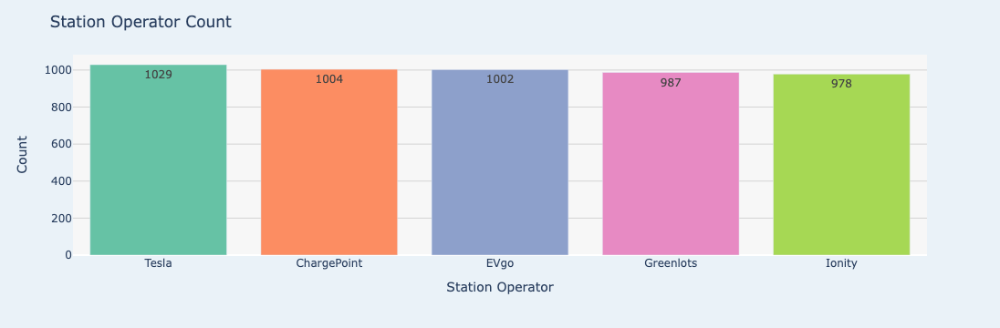

In [13]:
counts = df['Station Operator'].value_counts().reset_index()
counts.columns = ["Station Operator", "Count"]

# bar chart
fig = px.bar(
    counts,
    x="Station Operator",
    y="Count",
    text="Count",
    color="Station Operator",   
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Layout customizations
fig.update_layout(
    title="Station Operator Count",
    xaxis_title="Station Operator",
    yaxis_title="Count",
    xaxis_tickangle=0,
    showlegend=False,   # legend not needed since x labels already show operator
    plot_bgcolor="#f7f7f7",   # background inside plotting area
    paper_bgcolor="#eaf2f8",  # outer background
)

# Customize grid colors
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=True, gridcolor="lightgray")

fig.show()


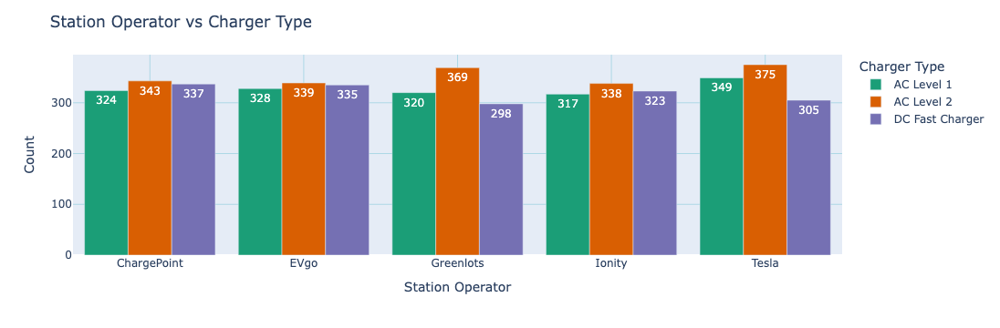

In [14]:
# Count occurrences
counts = df.groupby(["Station Operator", "Charger Type"]).size().reset_index(name="Count")

fig = px.bar(
    counts,
    x="Station Operator",
    y="Count",
    color="Charger Type",
    barmode="group",   # grouped bars
    text="Count",      # show counts on bars
    color_discrete_sequence=px.colors.qualitative.Dark2
)

fig.update_xaxes(showgrid=True,gridcolor="lightblue")
fig.update_yaxes(showgrid=True,gridcolor="lightblue")

fig.update_layout(
    title="Station Operator vs Charger Type",
    xaxis_title="Station Operator",
    yaxis_title="Count",
    xaxis_tickangle=0,
    legend_title="Charger Type",
    bargap=0.15
)

fig.show()

In [16]:
df['Address']

0            4826 Random Rd, City 98, Country
1       8970 San Francisco Ave, San Francisco
2                   5974 Bangkok Ave, Bangkok
3                   6995 Toronto Ave, Toronto
4                     5704 Mumbai Ave, Mumbai
                        ...                  
4995                   614 Berlin Ave, Berlin
4996            5494 São Paulo Ave, São Paulo
4997                7567 Chicago Ave, Chicago
4998                    8710 Dubai Ave, Dubai
4999        1221 Los Angeles Ave, Los Angeles
Name: Address, Length: 5000, dtype: object

In [19]:
df['City'] = df['Address'].str.split(',').str[-1]

In [21]:
df.head()

,Station ID,Latitude,Longitude,Address,Charger Type,Cost (USD/kWh),Availability,Distance to City (km),Usage Stats (avg users/day),Station Operator,Charging Capacity (kW),Connector Types,Installation Year,Renewable Energy Source,Reviews (Rating),Parking Spots,Maintenance Frequency,City
0,EVS00001,-33.400998,77.974972,"4826 Random Rd, City 98, Country",AC Level 2,0.27,9:00-18:00,4.95,35,EVgo,350,"CCS, CHAdeMO",2013,Yes,4.0,7,Annually,Country
1,EVS00002,37.861857,-122.490299,"8970 San Francisco Ave, San Francisco",DC Fast Charger,0.19,24/7,4.96,83,EVgo,350,"Tesla, Type 2",2010,Yes,3.9,2,Monthly,San Francisco
2,EVS00003,13.776092,100.412776,"5974 Bangkok Ave, Bangkok",AC Level 2,0.48,6:00-22:00,8.54,24,ChargePoint,50,"Type 2, CCS",2019,No,3.6,9,Annually,Bangkok
3,EVS00004,43.628250,-79.468935,"6995 Toronto Ave, Toronto",AC Level 1,0.41,9:00-18:00,13.28,70,Greenlots,350,Type 2,2010,Yes,4.2,7,Monthly,Toronto
4,EVS00005,19.119865,72.913368,"5704 Mumbai Ave, Mumbai",AC Level 2,0.11,9:00-18:00,9.76,19,EVgo,350,CCS,2015,Yes,3.7,6,Annually,Mumbai


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Station ID                   5000 non-null   object 
 1   Latitude                     5000 non-null   float64
 2   Longitude                    5000 non-null   float64
 3   Address                      5000 non-null   object 
 4   Charger Type                 5000 non-null   object 
 5   Cost (USD/kWh)               5000 non-null   float64
 6   Availability                 5000 non-null   object 
 7   Distance to City (km)        5000 non-null   float64
 8   Usage Stats (avg users/day)  5000 non-null   int64  
 9   Station Operator             5000 non-null   object 
 10  Charging Capacity (kW)       5000 non-null   int64  
 11  Connector Types              5000 non-null   object 
 12  Installation Year            5000 non-null   int64  
 13  Renewable Energy S

In [25]:
df['City'].value_counts()

City
Country          500
San Francisco    324
Mexico City      321
Beijing          319
Mumbai           315
Bangkok          314
Cape Town        314
Chicago          308
Seoul            299
Dubai            296
Sydney           295
Berlin           292
Los Angeles      286
Moscow           281
São Paulo        279
Toronto          257
Name: count, dtype: int64

In [27]:
print(" Country" in df['City'].values)

True


In [29]:
df_country = df[df["City"] == " Country"]

In [31]:
df_country

,Station ID,Latitude,Longitude,Address,Charger Type,Cost (USD/kWh),Availability,Distance to City (km),Usage Stats (avg users/day),Station Operator,Charging Capacity (kW),Connector Types,Installation Year,Renewable Energy Source,Reviews (Rating),Parking Spots,Maintenance Frequency,City
0,EVS00001,-33.400998,77.974972,"4826 Random Rd, City 98, Country",AC Level 2,0.27,9:00-18:00,4.95,35,EVgo,350,"CCS, CHAdeMO",2013,Yes,4.0,7,Annually,Country
10,EVS00011,19.944111,26.228083,"7123 Random Rd, City 463, Country",AC Level 1,0.39,9:00-18:00,17.42,59,EVgo,22,"Tesla, CHAdeMO",2013,No,3.7,5,Quarterly,Country
20,EVS00021,81.568159,-92.791385,"6470 Random Rd, City 207, Country",DC Fast Charger,0.30,6:00-22:00,10.43,43,Ionity,150,"CHAdeMO, Tesla",2016,Yes,3.3,10,Quarterly,Country
30,EVS00031,53.038440,17.213144,"8491 Random Rd, City 59, Country",AC Level 2,0.17,24/7,9.13,36,Tesla,22,"CHAdeMO, CCS",2018,Yes,3.6,5,Quarterly,Country
40,EVS00041,-52.343695,-47.887828,"1309 Random Rd, City 47, Country",AC Level 1,0.44,6:00-22:00,2.03,20,EVgo,350,Tesla,2014,No,5.0,3,Annually,Country
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4950,EVS04951,12.781010,66.156340,"6256 Random Rd, City 99, Country",AC Level 2,0.46,6:00-22:00,18.78,24,EVgo,22,CHAdeMO,2011,No,3.8,4,Annually,Country
4960,EVS04961,86.937008,109.054632,"8506 Random Rd, City 11, Country",AC Level 2,0.28,9:00-18:00,10.07,99,Greenlots,22,"Type 2, Tesla",2012,Yes,4.1,5,Quarterly,Country
4970,EVS04971,16.328035,69.512458,"5876 Random Rd, City 401, Country",AC Level 2,0.46,24/7,4.59,66,Ionity,50,CCS,2018,No,4.6,2,Quarterly,Country
4980,EVS04981,59.796982,31.709833,"7943 Random Rd, City 415, Country",DC Fast Charger,0.50,9:00-18:00,17.30,64,EVgo,22,Type 2,2016,Yes,3.1,1,Quarterly,Country


In [33]:
df_country['Connector Types'].value_counts()

Connector Types
CCS                85
CHAdeMO            64
Type 2             64
Tesla              52
CCS, Type 2        23
Tesla, CCS         22
Type 2, CHAdeMO    22
CHAdeMO, Type 2    22
CHAdeMO, Tesla     21
CCS, CHAdeMO       20
Tesla, Type 2      20
CHAdeMO, CCS       19
Type 2, Tesla      18
Type 2, CCS        18
CCS, Tesla         16
Tesla, CHAdeMO     14
Name: count, dtype: int64

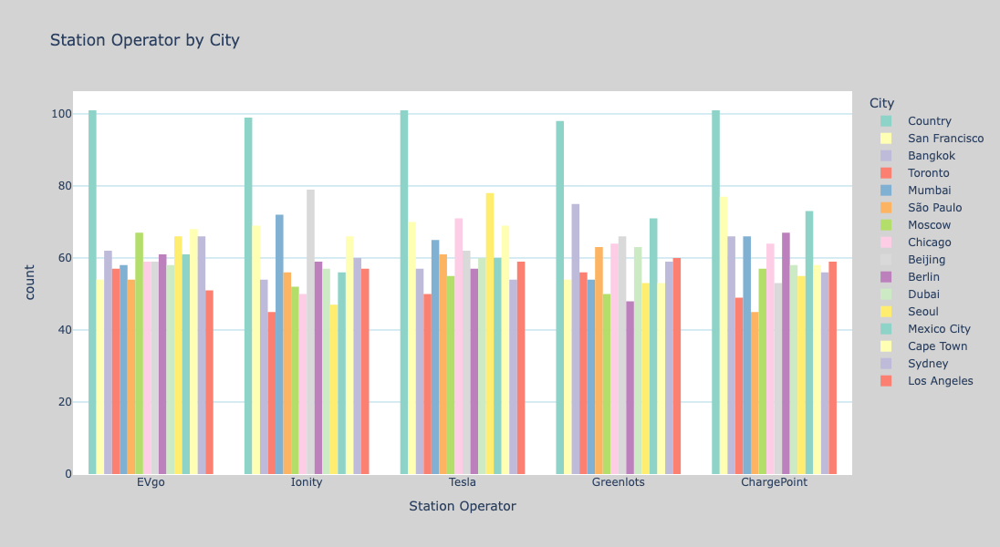

In [35]:
fig = px.histogram(
    df,
    x="Station Operator",
    color="City",
    barmode="group",
    title="Station Operator by City",
    color_discrete_sequence=px.colors.qualitative.Set3
)

# Customize layout + increase graph size
fig.update_layout(
    width=1100,          # width of the graph
    height=600,         # height of the graph (increase here)
    plot_bgcolor="white",
    paper_bgcolor="lightgray",
    xaxis=dict(showgrid=False),
    yaxis=dict(gridcolor="lightblue"),
    bargap=0.2
)

fig.show()


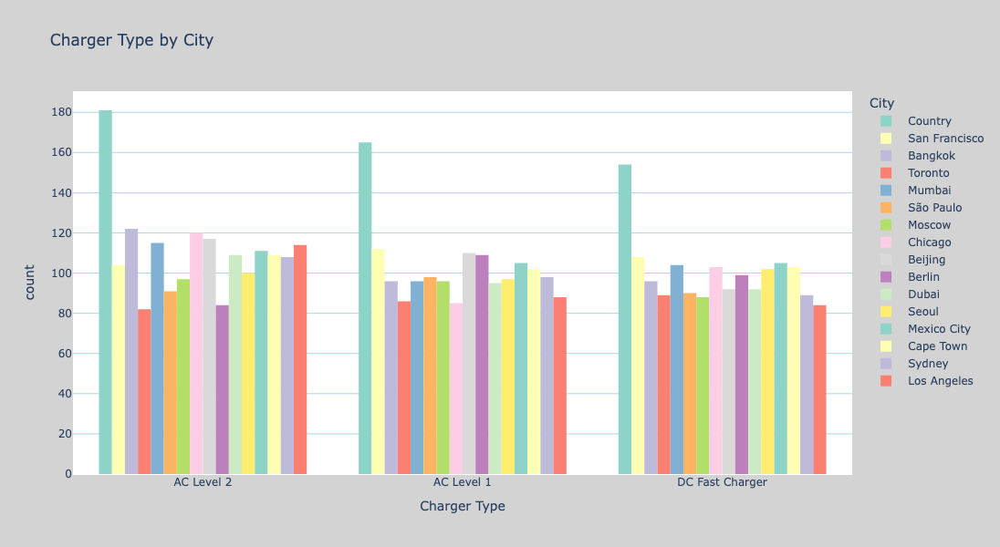

In [37]:
fig = px.histogram(
    df,
    x="Charger Type",
    color="City",
    barmode="group",
    title="Charger Type by City",
    color_discrete_sequence=px.colors.qualitative.Set3
)

# Customize layout + increase graph size
fig.update_layout(
    width=1100,          # width of the graph
    height=600,         # height of the graph (increase here)
    plot_bgcolor="white",
    paper_bgcolor="lightgray",
    xaxis=dict(showgrid=False),
    yaxis=dict(gridcolor="lightblue"),
    bargap=0.2
)

fig.show()

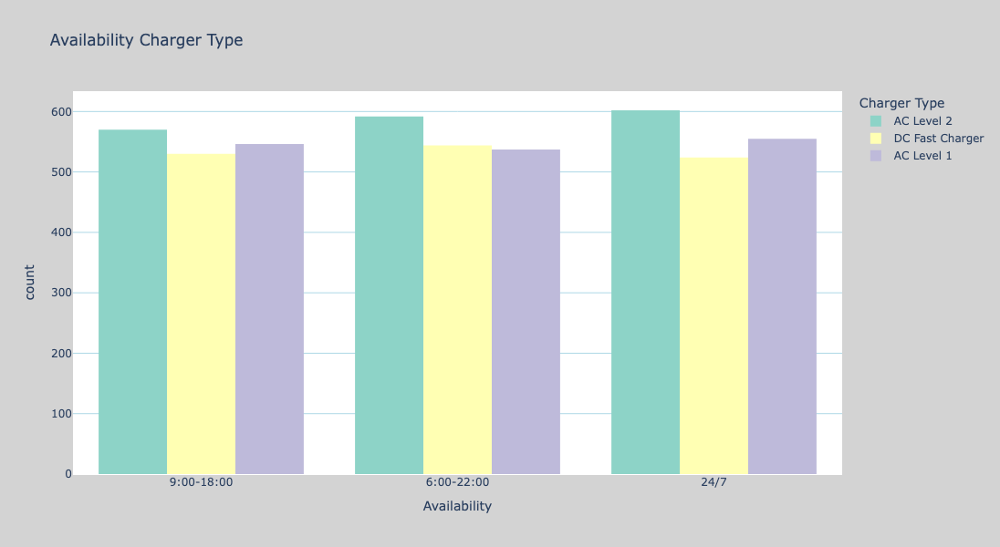

In [38]:
fig = px.histogram(
    df,
    x="Availability",
    color="Charger Type",
    barmode="group",
    title="Availability Charger Type",
    color_discrete_sequence=px.colors.qualitative.Set3
)

# Customize layout + increase graph size
fig.update_layout(
    width=1100,          # width of the graph
    height=600,         # height of the graph (increase here)
    plot_bgcolor="white",
    paper_bgcolor="lightgray",
    xaxis=dict(showgrid=False),
    yaxis=dict(gridcolor="lightblue"),
    bargap=0.2
)

fig.show()

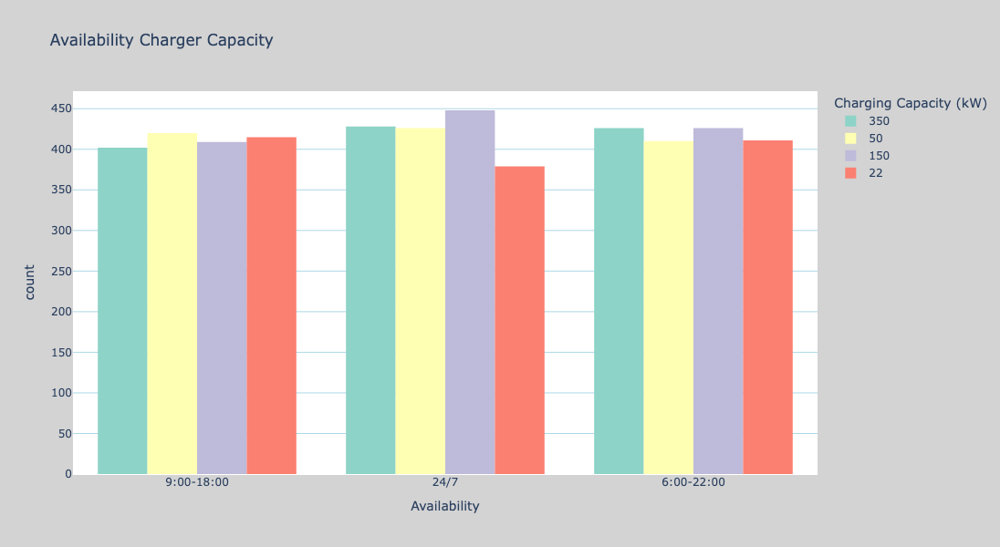

In [41]:
fig = px.histogram(
    df,
    x="Availability",
    color="Charging Capacity (kW)",
    barmode="group",
    title="Availability Charger Capacity",
    color_discrete_sequence=px.colors.qualitative.Set3
)

# Customize layout + increase graph size
fig.update_layout(
    width=1100,          # width of the graph
    height=600,         # height of the graph (increase here)
    plot_bgcolor="white",
    paper_bgcolor="lightgray",
    xaxis=dict(showgrid=False),
    yaxis=dict(gridcolor="lightblue"),
    bargap=0.2
)

fig.show()

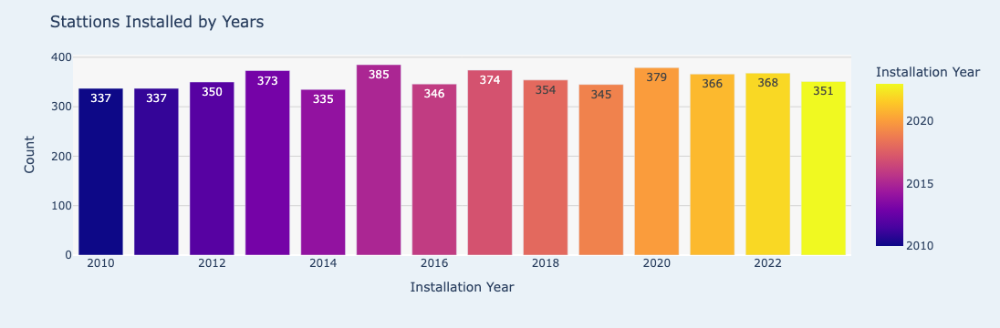

In [43]:
counts = df['Installation Year'].value_counts().reset_index()
counts.columns = ["Installation Year", "Count"]

# Plotly bar chart
fig = px.bar(
    counts,
    x="Installation Year",
    y="Count",
    text="Count",
    color="Installation Year",   # different color per category
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Layout customizations
fig.update_layout(
    title="Stattions Installed by Years",
    xaxis_title="Installation Year",
    yaxis_title="Count",
    xaxis_tickangle=0,
    showlegend=False,   # legend not needed since x labels already show operator
    plot_bgcolor="#f7f7f7",   # background inside plotting area
    paper_bgcolor="#eaf2f8",  # outer background
)

# Customize grid colors
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=True, gridcolor="lightgray")

fig.show()


In [45]:
df['Installation Year'].value_counts()

Installation Year
2015    385
2020    379
2017    374
2013    373
2022    368
2021    366
2018    354
2023    351
2012    350
2016    346
2019    345
2010    337
2011    337
2014    335
Name: count, dtype: int64

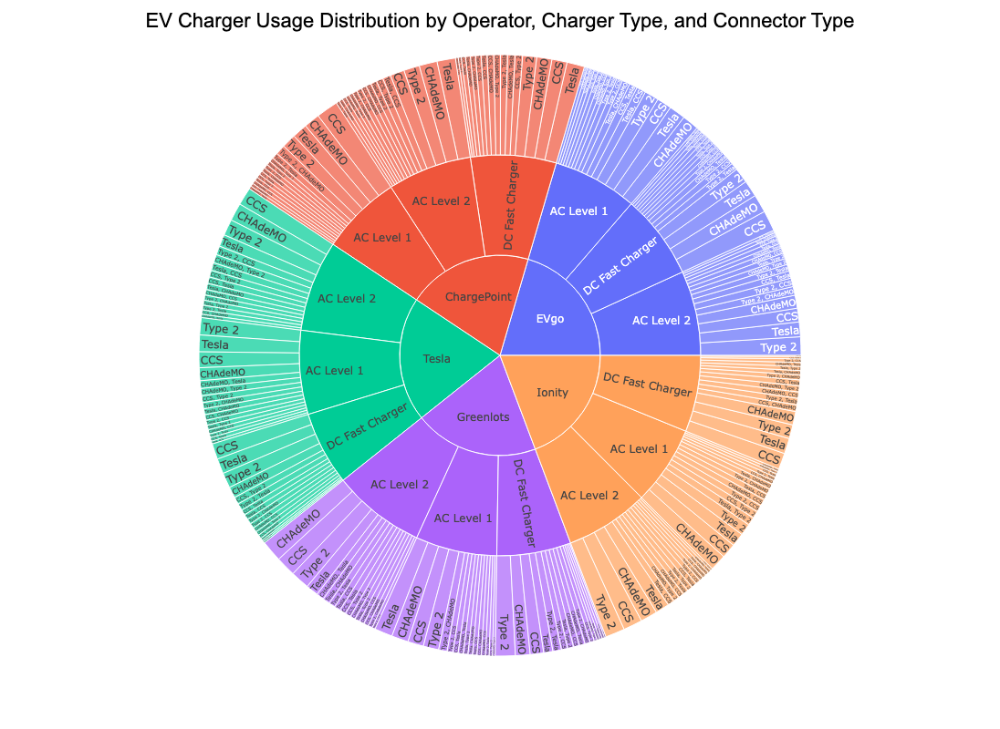

In [47]:
fig = px.sunburst(
    df,
    path=["Station Operator", "Charger Type", "Connector Types"],
    values="Usage Stats (avg users/day)",
    height=800,
    width=1100
)

fig.update_layout(
    title_text="EV Charger Usage Distribution by Operator, Charger Type, and Connector Type",
    title_x=0.5,  # centers the title
    title_font=dict(size=22, family="Arial", color="black")
)

fig.show()


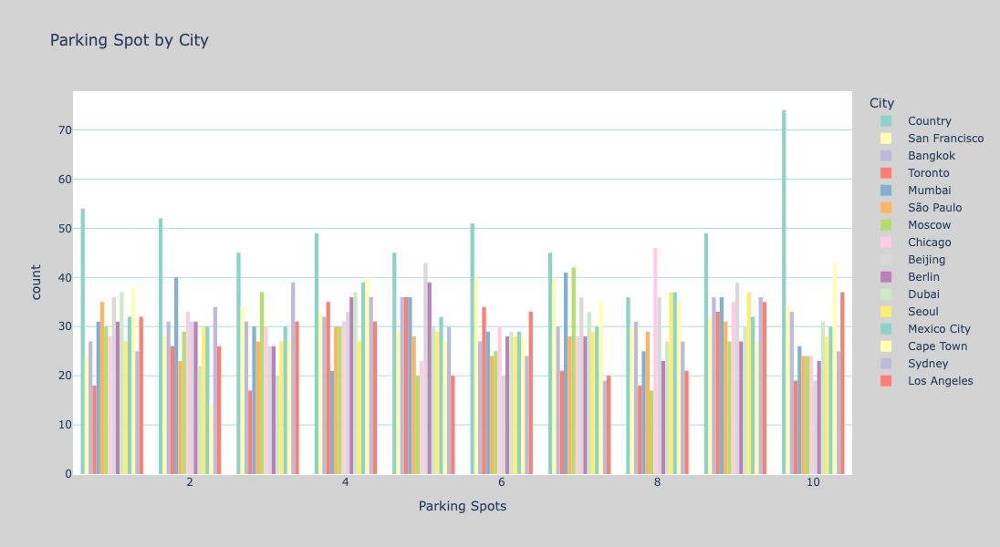

In [49]:
fig = px.histogram(
    df,
    x="Parking Spots",
    color="City",
    barmode="group",
    title="Parking Spot by City",
    color_discrete_sequence=px.colors.qualitative.Set3
)

# Customize layout + increase graph size
fig.update_layout(
    width=1100,          # width of the graph
    height=600,         # height of the graph (increase here)
    plot_bgcolor="white",
    paper_bgcolor="lightgray",
    xaxis=dict(showgrid=False),
    yaxis=dict(gridcolor="lightblue"),
    bargap=0.2
)

fig.show()

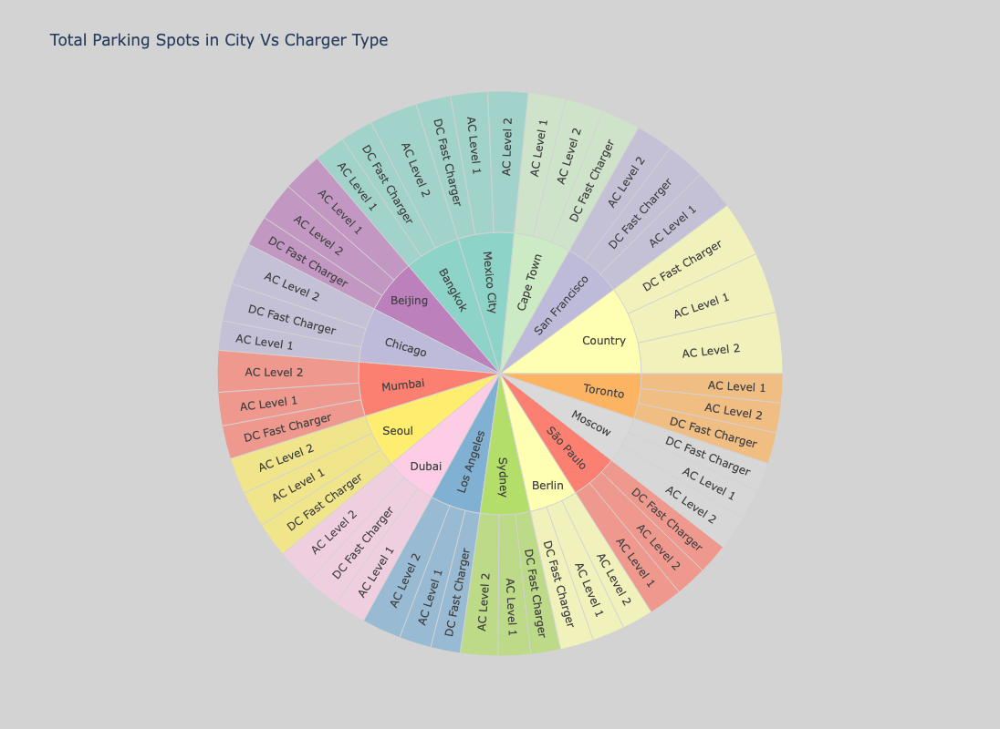

In [51]:
import plotly.express as px

fig = px.sunburst(
    df,
    path=["City", "Charger Type"],   # hierarchy
    values="Parking Spots",          # size of sectors
    color="City",                    # coloring
    color_discrete_sequence=px.colors.qualitative.Set3,
    title="Total Parking Spots in City Vs Charger Type"
)

# Customize layout
fig.update_layout(
    width=1100,
    height=800,
    plot_bgcolor="white",
    paper_bgcolor="lightgray"
)

fig.show()


In [53]:
df['Station_Age'] = 2025 - df['Installation Year']
df['Connector_Count'] = df['Connector Types'].apply(lambda x: len(str(x).split(',')))
df['Fast_DC_Flag'] = df['Charger Type'].apply(lambda x: 1 if 'DC' in str(x) else 0)

In [55]:
drop_cols = ['Station ID', 'Address', 'City', 'Connector Types']
data = df.drop(columns=drop_cols)

In [57]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [58]:
X = data.select_dtypes(include=[np.number]).fillna(0)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [89]:
sil_scores = []
for k in range(2, 10):
    km = KMeans(n_clusters=k, random_state=42)
    labels = km.fit_predict(X_scaled)
    sil = silhouette_score(X_scaled, labels)
    sil_scores.append((k, sil))
    print(f"k={k}, silhouette={sil:.3f}")

k=2, silhouette=0.117
k=3, silhouette=0.103
k=4, silhouette=0.081
k=5, silhouette=0.083
k=6, silhouette=0.072
k=7, silhouette=0.072
k=8, silhouette=0.069
k=9, silhouette=0.066


In [62]:
best_k = max(sil_scores, key=lambda x: x[1])[0]
print("Best k:", best_k)

Best k: 2


In [63]:
kmeans = KMeans(n_clusters=best_k, random_state=42)
df['MarketSegment'] = kmeans.fit_predict(X_scaled)

In [64]:
kmeans = KMeans(n_clusters=best_k, random_state=42)
df['MarketSegment'] = kmeans.fit_predict(X_scaled)

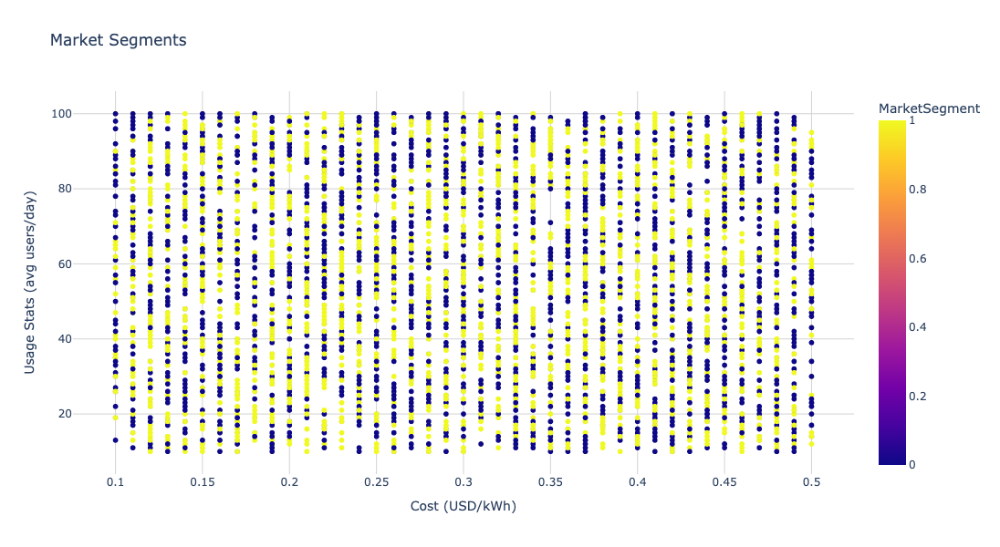

In [65]:
fig = px.scatter(
    df,
    x="Cost (USD/kWh)",
    y="Usage Stats (avg users/day)",
    color="MarketSegment",
    title="Market Segments",
    hover_data=df.columns,  # show all columns on hover
    size_max=10,
    template="plotly_white",  # clean style
    color_discrete_sequence=px.colors.qualitative.Set3  # better palette
)

# Customize layout
fig.update_layout(
    width=1000,
    height=600,
    plot_bgcolor="rgba(0,0,0,0)",  # transparent background
    xaxis=dict(title="Cost (USD/kWh)", gridcolor="lightgrey"),
    yaxis=dict(title="Usage Stats (avg users/day)", gridcolor="lightgrey"),
    legend=dict(title="Market Segment", bordercolor="black", borderwidth=1)
)

fig.show()

In [66]:
print(' Mumbai' in df['City'].values)

True


In [73]:
df_india = df[df['City'] == ' Mumbai']

In [75]:
df_india

,Station ID,Latitude,Longitude,Address,Charger Type,Cost (USD/kWh),Availability,Distance to City (km),Usage Stats (avg users/day),Station Operator,...,Installation Year,Renewable Energy Source,Reviews (Rating),Parking Spots,Maintenance Frequency,City,Station_Age,Connector_Count,Fast_DC_Flag,MarketSegment
4,EVS00005,19.119865,72.913368,"5704 Mumbai Ave, Mumbai",AC Level 2,0.11,9:00-18:00,9.76,19,EVgo,...,2015,Yes,3.7,6,Annually,Mumbai,10,1,0,0
46,EVS00047,19.055518,72.889370,"2970 Mumbai Ave, Mumbai",AC Level 1,0.35,24/7,19.40,68,Ionity,...,2021,Yes,3.0,9,Quarterly,Mumbai,4,2,0,1
55,EVS00056,19.118476,72.956977,"5574 Mumbai Ave, Mumbai",AC Level 2,0.18,6:00-22:00,11.91,50,ChargePoint,...,2013,Yes,4.2,4,Quarterly,Mumbai,12,1,0,0
78,EVS00079,18.959930,72.979858,"3381 Mumbai Ave, Mumbai",DC Fast Charger,0.27,6:00-22:00,10.44,75,ChargePoint,...,2022,Yes,4.6,2,Annually,Mumbai,3,2,1,1
107,EVS00108,18.979560,72.963574,"9772 Mumbai Ave, Mumbai",AC Level 2,0.11,6:00-22:00,3.14,43,Tesla,...,2020,Yes,5.0,7,Annually,Mumbai,5,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4966,EVS04967,19.020302,72.811961,"3323 Mumbai Ave, Mumbai",AC Level 2,0.11,6:00-22:00,4.52,71,ChargePoint,...,2019,Yes,4.3,3,Quarterly,Mumbai,6,2,0,1
4981,EVS04982,19.054520,72.815813,"9112 Mumbai Ave, Mumbai",DC Fast Charger,0.20,24/7,6.22,34,EVgo,...,2020,Yes,4.1,9,Monthly,Mumbai,5,1,1,1
4985,EVS04986,18.956798,72.929714,"2412 Mumbai Ave, Mumbai",AC Level 2,0.12,24/7,14.47,68,Ionity,...,2015,No,4.1,3,Annually,Mumbai,10,2,0,0
4986,EVS04987,18.998066,72.930494,"3480 Mumbai Ave, Mumbai",AC Level 1,0.29,24/7,10.36,13,Greenlots,...,2017,Yes,3.7,10,Monthly,Mumbai,8,1,0,1


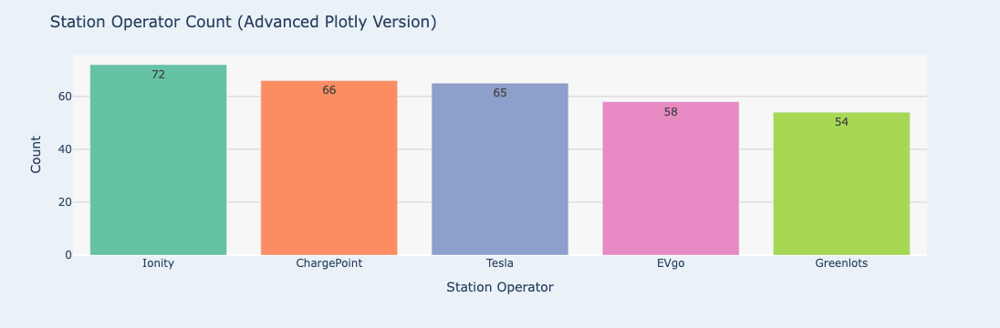

In [77]:
counts_india = df_india['Station Operator'].value_counts().reset_index()
counts_india.columns = ["Station Operator", "Count"]

# Plotly bar chart
fig = px.bar(
    counts_india,
    x="Station Operator",
    y="Count",
    text="Count",
    color="Station Operator",   # different color per category
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Layout customizations
fig.update_layout(
    title="Station Operator Count (Advanced Plotly Version)",
    xaxis_title="Station Operator",
    yaxis_title="Count",
    xaxis_tickangle=0,
    showlegend=False,   # legend not needed since x labels already show operator
    plot_bgcolor="#f7f7f7",   # background inside plotting area
    paper_bgcolor="#eaf2f8",  # outer background
)

# Customize grid colors
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=True, gridcolor="lightgray")

fig.show()


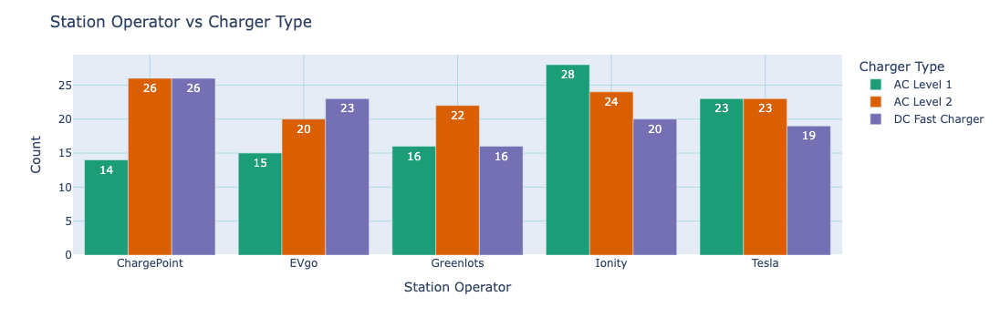

In [79]:
# Count occurrences
counts_india = df_india.groupby(["Station Operator", "Charger Type"]).size().reset_index(name="Count")

fig = px.bar(
    counts_india,
    x="Station Operator",
    y="Count",
    color="Charger Type",
    barmode="group",   # grouped bars
    text="Count",      # show counts on bars
    color_discrete_sequence=px.colors.qualitative.Dark2
)

fig.update_xaxes(showgrid=True,gridcolor="lightblue")
fig.update_yaxes(showgrid=True,gridcolor="lightblue")

fig.update_layout(
    title="Station Operator vs Charger Type",
    xaxis_title="Station Operator",
    yaxis_title="Count",
    xaxis_tickangle=0,
    legend_title="Charger Type",
    bargap=0.15
)

fig.show()

# By Mohammed Sohail Mirza
## Email - mdssohail1018@gmail.com